In [662]:
import pandas as pd
import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import uniform, randint
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from catboost import CatBoostClassifier
from xgboost import XGBClassifier

In [616]:
df = pd.read_csv('drug_consumption.csv')

Для начала посмотрим на наши данные

In [617]:
df

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
0,1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,...,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,...,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,...,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,1887,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,...,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0


Хотим различать только два состояния: употреблял или нет

In [618]:
usage_col = {
    'CL0': '0',
    'CL1': '1',
    'CL2': '1',
    'CL3': '1',
    'CL4': '1',
    'CL5': '1',
    'CL6': '1',
}

попробуем взять все данные и обучить на них две простые модельки что бы посмотреть на сколько хорошие результаты мы вообще можем показать

In [619]:
df_alco = df[['Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Alcohol']]

df_alco = df_alco.replace(usage_col)
df_alco

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,1
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,1
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,1
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,1
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,1
1881,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,1
1882,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,1
1883,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,1.29221,1.22470,1


на этом моменте стало понятно что просто тестово обучаться на алкоголt не лучшая идея, тк почти все пробовали (1,2% нет)
попробуем мет, там распределение ~50/50

In [620]:
df_met = df[['Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Amphet']]

df_met = df_met.replace(usage_col)
df_met

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Amphet
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,1
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,1
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,0
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,0
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,0
1881,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,0
1882,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,1
1883,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,1.29221,1.22470,0


теперь попробуем обучить на этом деле LR и RF, посмотрим что получится

In [621]:
train, test = train_test_split(df_met, random_state=42, test_size=0.2)
x_train = train.drop('Amphet', axis=1)
x_test = test.drop('Amphet', axis=1)
y_train = train['Amphet']
y_test = test['Amphet']

In [622]:
LR = LogisticRegression(random_state=42)
LR.fit(x_train, y_train)
y_pred = LR.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.6727272727272727

In [623]:
RF = RandomForestClassifier(random_state=42)
RF.fit(x_train, y_train)
y_pred = RF.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.6542553191489362

что то уже есть, проверим нашу лучшую модель на каких то других сбалансированных данных и параллельно построим модель, которую обучим уже на тех данных (возьмем для этого бензин)
этот эксперимент нам нужен что бы понять, можно ли одной моделью предсказывать все или надо иметь модель под все виды наркотиков

In [624]:
df_benz = df[['Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Benzos']]

df_benz = df_benz.replace(usage_col)
df_benz

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Benzos
0,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,1
1,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,0
2,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,0
3,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,1
4,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,0
1881,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,0
1882,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,1
1883,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,1.29221,1.22470,0


In [625]:
x_test = df_benz.drop('Benzos', axis=1)
y_test = df_benz['Benzos']

In [626]:
y_pred = RF.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.6932314410480349

In [627]:
train, test = train_test_split(df_benz, random_state=42, test_size=0.2)
x_train = train.drop('Benzos', axis=1)
x_test = test.drop('Benzos', axis=1)
y_train = train['Benzos']
y_test = test['Benzos']

In [628]:
LR = LogisticRegression(random_state=42)
LR.fit(x_train, y_train)
y_pred = LR.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.6871165644171779

получили разницу в 0,01 => предварительно можем предиктить одной моделью (важно обучить на сбалансированных данных)
теперь хотим поиграться с моделями и стобцами чтобы увеличить precision

Как бы не хотелось выкинуть такие поля, как Nscore, Escore, Oscore, Ascore, Cscore, Impulsive, SS, но именно они характерезуют конкретного человека, почти все остальные параметры по сути являются более общими, а значит не характерезуют конкретного человека 
Исходя из этой логики можем попробовать удалить Country, а еще Age, тк мы ставим целью предсказывать будущее употребление наркотиков

теперь посмотрим попарные графики что бы проверить нашу гипотизу про country

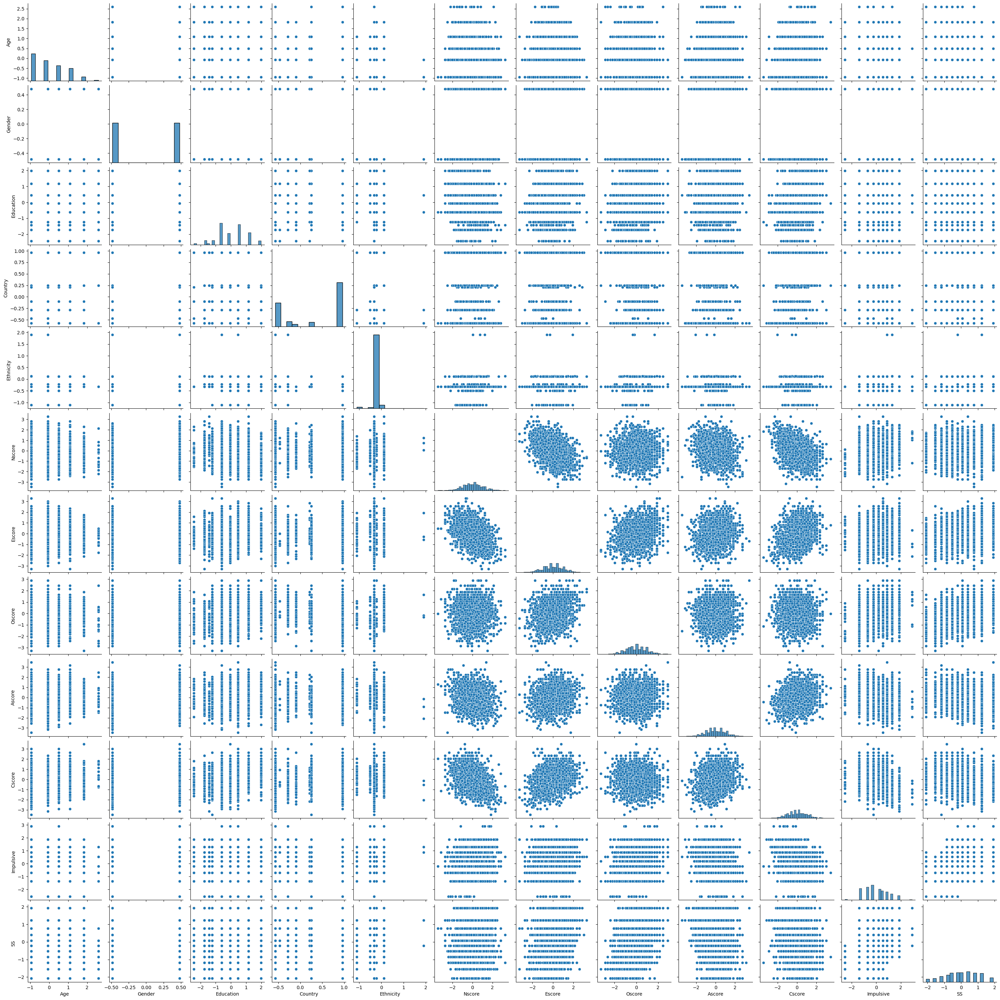

In [629]:
sns.pairplot(df_benz)
plt.show()

коллинеарных столбцов не нашел, теперь попробуем понижение размерности

In [631]:
train, test = train_test_split(df_benz, random_state=42, test_size=0.2)
x_train = train.drop('Benzos', axis=1)
x_test = test.drop('Benzos', axis=1)
y_train = train['Benzos']
y_test = test['Benzos']

In [632]:
pca = PCA(0.87, random_state=42)
df_benz_filtred = pca.fit_transform(df_benz.drop('Benzos', axis=1))
var = pca.explained_variance_ratio_
print(f'Всего объяснено: {var.sum():.2f}')
print(f'Количество осей: {len(var)}')

Всего объяснено: 0.91
Количество осей: 8


In [633]:
x_train, x_test, y_train, y_test = train_test_split(df_benz_filtred, df_benz['Benzos'], test_size=0.2, random_state=42)

In [634]:
LR = LogisticRegression(random_state=42)
LR.fit(x_train, y_train)
y_pred = LR.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.650887573964497

уменьшение размерности в данном случае негативно влияет на результат
попробую ручками немного поиграться

In [635]:
df_benz_filtred = df_benz[['Education', 'Ethnicity', 'Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Benzos']]

In [636]:
train, test = train_test_split(df_benz_filtred, random_state=42, test_size=0.2)
x_train = train.drop('Benzos', axis=1)
x_test = test.drop('Benzos', axis=1)
y_train = train['Benzos']
y_test = test['Benzos']

In [637]:
LR = LogisticRegression(random_state=42)
LR.fit(x_train, y_train)
y_pred = LR.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.6363636363636364

убрав еще гендер смогли немного улучшить модель
теперь хотим значительно улучшить показатели, есть две идеи, пройти RandomSearch-ем или CatBoost-ом

In [639]:
train, test = train_test_split(df_benz_filtred, random_state=42, test_size=0.2)
x_train = train.drop('Benzos', axis=1)
x_test = test.drop('Benzos', axis=1)
y_train = train['Benzos']
y_test = test['Benzos']

In [640]:
xgb = XGBClassifier(n_estimators=1000)
y_train = y_train.astype(int)
xgb.fit(x_train, y_train)
y_pred = xgb.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.5965909090909091

In [641]:
train, test = train_test_split(df_benz_filtred, random_state=42, test_size=0.2)
x_train = train.drop('Benzos', axis=1)
x_test = test.drop('Benzos', axis=1)
y_train = train['Benzos']
y_test = test['Benzos']

In [642]:
cb1 = CatBoostClassifier(
    loss_function='MultiClass', 
    learning_rate=0.337702, 
    random_seed=42,
    iterations=550)
cb1.fit(
    x_train, y_train,
    eval_set=(x_test, y_test),
)

0:	learn: 0.6616479	test: 0.6667645	best: 0.6667645 (0)	total: 4.42ms	remaining: 2.42s
1:	learn: 0.6436775	test: 0.6482094	best: 0.6482094 (1)	total: 5.19ms	remaining: 1.42s
2:	learn: 0.6304850	test: 0.6374993	best: 0.6374993 (2)	total: 5.87ms	remaining: 1.07s
3:	learn: 0.6213567	test: 0.6290862	best: 0.6290862 (3)	total: 6.38ms	remaining: 872ms
4:	learn: 0.6143292	test: 0.6259324	best: 0.6259324 (4)	total: 6.85ms	remaining: 747ms
5:	learn: 0.6086990	test: 0.6211607	best: 0.6211607 (5)	total: 7.45ms	remaining: 676ms
6:	learn: 0.6055481	test: 0.6212729	best: 0.6211607 (5)	total: 8.15ms	remaining: 632ms
7:	learn: 0.5982444	test: 0.6193305	best: 0.6193305 (7)	total: 8.77ms	remaining: 594ms
8:	learn: 0.5949779	test: 0.6198600	best: 0.6193305 (7)	total: 9.26ms	remaining: 557ms
9:	learn: 0.5925537	test: 0.6183936	best: 0.6183936 (9)	total: 9.73ms	remaining: 525ms
10:	learn: 0.5894162	test: 0.6155337	best: 0.6155337 (10)	total: 10.2ms	remaining: 501ms
11:	learn: 0.5853969	test: 0.6184592	best

In [643]:
y_pred = cb1.predict(x_test)
y_pred = y_pred.astype(int)
y_test = y_test.astype(int)
precision_score(y_test, y_pred)

0.6415094339622641

Регрессия и классификация из катбуста показали себя достаточно хорошо, проверим их на всех данных
заодно поймем, что на самом деле хотим детектить только эти колонки


In [644]:
x_test = df[['Education', 'Ethnicity', 'Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS']]
tests = ['Alcohol', 'Caff', 'Cannabis', 'Choc', 'Coke', 'Ecstasy', 'LSD', 'Mushrooms', 'Nicotine']

In [645]:
stat = {}
for test in tests:
    y_test = df[test].replace(usage_col)
    y_pred = cb1.predict(x_test)
    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)
    stat[test] = precision_score(y_test, y_pred)
stat

{'Alcohol': 0.9879227053140096,
 'Caff': 0.9927536231884058,
 'Cannabis': 0.9371980676328503,
 'Choc': 0.9842995169082126,
 'Coke': 0.6268115942028986,
 'Ecstasy': 0.644927536231884,
 'LSD': 0.6243961352657005,
 'Mushrooms': 0.6727053140096618,
 'Nicotine': 0.893719806763285}

In [646]:
stat = {}
for test in tests:
    y_test = df[test].replace(usage_col)
    y_pred = xgb.predict(x_test)
    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)
    stat[test] = precision_score(y_test, y_pred)
stat

{'Alcohol': 0.9932356257046223,
 'Caff': 0.9943630214205186,
 'Cannabis': 0.9064261555806088,
 'Choc': 0.9830890642615558,
 'Coke': 0.6595264937993236,
 'Ecstasy': 0.6324689966178129,
 'LSD': 0.6257046223224352,
 'Mushrooms': 0.657271702367531,
 'Nicotine': 0.8714768883878241}

Как можно заметить лучше всего показывает себя отечественный CatBoost, теперь уменьшмим выборку (шоколад, кофеин, никотин и алкоголь пробовали почти все опрошенные, да и это предсказвать не особо интересно, по этому будем смотреть именно наркотики)

Теперь можем дообучить нашу модель на интересующей нас выборке

In [647]:
for test in ['Coke', 'Ecstasy', 'LSD', 'Mushrooms']:
    X_train, X_test, y_train, y_test = train_test_split(x_test, df[test].replace(usage_col), test_size=0.2, random_state=42)
    cb1.fit(X_train, y_train, init_model=cb1, eval_set=(X_test, y_test), use_best_model=True)

0:	learn: 0.5944961	test: 0.6404712	best: 0.6404712 (0)	total: 539us	remaining: 296ms
1:	learn: 0.5882376	test: 0.6402510	best: 0.6402510 (1)	total: 1.16ms	remaining: 318ms
2:	learn: 0.5821593	test: 0.6399488	best: 0.6399488 (2)	total: 1.65ms	remaining: 300ms
3:	learn: 0.5768824	test: 0.6428424	best: 0.6399488 (2)	total: 2.17ms	remaining: 297ms
4:	learn: 0.5741698	test: 0.6450120	best: 0.6399488 (2)	total: 2.69ms	remaining: 293ms
5:	learn: 0.5725930	test: 0.6449514	best: 0.6399488 (2)	total: 3.16ms	remaining: 287ms
6:	learn: 0.5709182	test: 0.6447433	best: 0.6399488 (2)	total: 3.82ms	remaining: 297ms
7:	learn: 0.5656095	test: 0.6433938	best: 0.6399488 (2)	total: 4.67ms	remaining: 316ms
8:	learn: 0.5626511	test: 0.6443098	best: 0.6399488 (2)	total: 5.23ms	remaining: 314ms
9:	learn: 0.5607915	test: 0.6434459	best: 0.6399488 (2)	total: 5.86ms	remaining: 316ms
10:	learn: 0.5554377	test: 0.6440641	best: 0.6399488 (2)	total: 6.33ms	remaining: 310ms
11:	learn: 0.5499850	test: 0.6444287	best: 

In [648]:
stat = {}
for test in tests:
    y_test = df[test].replace(usage_col)
    y_pred = cb1.predict(x_test)
    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)
    stat[test] = precision_score(y_test, y_pred)
stat

{'Alcohol': 0.9880694143167028,
 'Caff': 0.9956616052060737,
 'Cannabis': 0.9620390455531453,
 'Choc': 0.9859002169197397,
 'Coke': 0.6420824295010846,
 'Ecstasy': 0.6919739696312365,
 'LSD': 0.7039045553145337,
 'Mushrooms': 0.7364425162689805,
 'Nicotine': 0.8915401301518439}

Смогли еще немного улучшить нашу модель, а теперь попробуем обучить модель на каждом отдельном наркотике и уже сравним наши результаты

In [649]:
k = {}
for test in tests:
    X_train, X_test, y_train, y_test = train_test_split(x_test, df[test].replace(usage_col), test_size=0.2, random_state=42)
    cb = CatBoostClassifier(
        loss_function='MultiClass',
        learning_rate=0.337702,
        random_seed=42,
        iterations=550)
    cb.fit(
        X_train, y_train,
        eval_set=(X_test, y_test),
    )

    y_pred = cb.predict(X_test)
    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)
    k[test] = [cb, precision_score(y_test, y_pred)]
    
k

0:	learn: 0.4399556	test: 0.4388021	best: 0.4388021 (0)	total: 537us	remaining: 295ms
1:	learn: 0.3051823	test: 0.3049931	best: 0.3049931 (1)	total: 980us	remaining: 269ms
2:	learn: 0.2246188	test: 0.2229624	best: 0.2229624 (2)	total: 1.39ms	remaining: 253ms
3:	learn: 0.1746905	test: 0.1742565	best: 0.1742565 (3)	total: 1.84ms	remaining: 251ms
4:	learn: 0.1422379	test: 0.1442111	best: 0.1442111 (4)	total: 2.2ms	remaining: 239ms
5:	learn: 0.1206104	test: 0.1234968	best: 0.1234968 (5)	total: 2.57ms	remaining: 233ms
6:	learn: 0.1063412	test: 0.1102093	best: 0.1102093 (6)	total: 3.01ms	remaining: 234ms
7:	learn: 0.0944283	test: 0.0985816	best: 0.0985816 (7)	total: 3.37ms	remaining: 228ms
8:	learn: 0.0872114	test: 0.0928614	best: 0.0928614 (8)	total: 3.73ms	remaining: 224ms
9:	learn: 0.0801205	test: 0.0860450	best: 0.0860450 (9)	total: 4.01ms	remaining: 216ms
10:	learn: 0.0758411	test: 0.0830581	best: 0.0830581 (10)	total: 4.41ms	remaining: 216ms
11:	learn: 0.0725398	test: 0.0799450	best: 0

{'Alcohol': [<catboost.core.CatBoostClassifier at 0x317784e10>,
  0.9814323607427056],
 'Caff': [<catboost.core.CatBoostClassifier at 0x308266b90>,
  0.986737400530504],
 'Cannabis': [<catboost.core.CatBoostClassifier at 0x31b5a9410>,
  0.8143712574850299],
 'Choc': [<catboost.core.CatBoostClassifier at 0x3085c5b90>,
  0.9893899204244032],
 'Coke': [<catboost.core.CatBoostClassifier at 0x308849490>,
  0.5389221556886228],
 'Ecstasy': [<catboost.core.CatBoostClassifier at 0x317103dd0>,
  0.6728395061728395],
 'LSD': [<catboost.core.CatBoostClassifier at 0x3085d7ad0>,
  0.6358024691358025],
 'Mushrooms': [<catboost.core.CatBoostClassifier at 0x308057590>,
  0.6797752808988764],
 'Nicotine': [<catboost.core.CatBoostClassifier at 0x177476410>,
  0.7707182320441989]}

итого есть много моделей которые в сумме справляются отлично
далее сделаем общий словарик с соответствующими моделями для каждого наркотика

In [650]:
models = {
    'Alcohol': k['Alcohol'][0],
    'Caff': k['Caff'][0],
    'Cannabis': k['Cannabis'][0],
    'Choc': k['Choc'][0],
    'Coke': k['Coke'][0],
    'Ecstasy': cb1,
    'LSD': k['LSD'][0],
    'Mushrooms': cb1,
    'Nicotine': cb1
}

In [651]:
stat = {}
for test in tests:
    y_test = df[test].replace(usage_col)
    y_pred = models[test].predict(x_test)
    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)
    stat[test] = precision_score(y_test, y_pred)
stat

{'Alcohol': 0.9850984566258648,
 'Caff': 0.9856763925729443,
 'Cannabis': 0.8464307138572286,
 'Choc': 0.9830238726790451,
 'Coke': 0.645381984036488,
 'Ecstasy': 0.6919739696312365,
 'LSD': 0.7493765586034913,
 'Mushrooms': 0.7364425162689805,
 'Nicotine': 0.8915401301518439}

теперь посмотрим результат на конкретном испытуемом, сейчас уже хотим смотреть распределение вероятностей, а не бинарный ответ

In [652]:
cb1.predict_proba(x_test.iloc[2]), df[tests].iloc[2]

/Users/timofejsosnin/anaconda3/envs/classical-ml/lib/python3.11/site-packages/catboost/core.py:1419: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



(array([0.57628513, 0.42371487]),
 Alcohol      CL6
 Caff         CL6
 Cannabis     CL3
 Choc         CL4
 Coke         CL0
 Ecstasy      CL0
 LSD          CL0
 Mushrooms    CL1
 Nicotine     CL0
 Name: 2, dtype: object)

на этом моменте стало понятно, что совершенна серьезная ошибка: мы никак не можем предиктить какие то конкретные наркотики, а выдаем просто склонность
вывод: необходимо обучить по моделе на каждый интересующий нас наркотик и определять конкретно его
к тому же стало понятно что детектить что либо из выборки Alcohol, Caff, Choc, Nicotine нам не интересно, тк эти препараты опять же пробовались всеми

In [653]:
x_test = df[['Education', 'Ethnicity', 'Nscore', 'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Alcohol', 'Caff', 'Choc', 'Nicotine']]
x_test = x_test.replace(usage_col)
tests = ['Cannabis', 'Coke', 'Ecstasy', 'LSD', 'Mushrooms']

увеличим вес столбцам с алкоголем и никотином, тк это в отличии от шоколада и кофеина более пагубные привычки и нормализуем данные

In [654]:
x_test['Alcohol'] = x_test['Alcohol'].astype(int) * 2
x_test['Nicotine'] = x_test['Nicotine'].astype(int) * 2

In [655]:
scaler = StandardScaler()

x_test = scaler.fit_transform(x_test)

теперь обучим на всем этом CatBoost, по модели на каждый накротик

In [656]:
k = {}
for test in tests:
    X_train, X_test, y_train, y_test = train_test_split(x_test, df[test].replace(usage_col), test_size=0.3, random_state=42)
    cb = CatBoostClassifier(
        loss_function='MultiClass',
        learning_rate=0.337702,
        random_seed=42,
        iterations=550)
    cb.fit(
        X_train, y_train,
        eval_set=(X_test, y_test),
    )

    y_pred = cb.predict(X_test)
    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)
    k[test] = [cb, precision_score(y_test, y_pred)]

k

0:	learn: 0.5461905	test: 0.5540442	best: 0.5540442 (0)	total: 514us	remaining: 282ms
1:	learn: 0.4638527	test: 0.4725726	best: 0.4725726 (1)	total: 1.04ms	remaining: 285ms
2:	learn: 0.4162426	test: 0.4307270	best: 0.4307270 (2)	total: 1.89ms	remaining: 344ms
3:	learn: 0.3845910	test: 0.4060671	best: 0.4060671 (3)	total: 2.51ms	remaining: 342ms
4:	learn: 0.3633696	test: 0.3872004	best: 0.3872004 (4)	total: 3.64ms	remaining: 396ms
5:	learn: 0.3480975	test: 0.3770021	best: 0.3770021 (5)	total: 4.15ms	remaining: 376ms
6:	learn: 0.3397401	test: 0.3662396	best: 0.3662396 (6)	total: 4.6ms	remaining: 357ms
7:	learn: 0.3276226	test: 0.3607752	best: 0.3607752 (7)	total: 5.1ms	remaining: 345ms
8:	learn: 0.3223926	test: 0.3568017	best: 0.3568017 (8)	total: 5.54ms	remaining: 333ms
9:	learn: 0.3131340	test: 0.3496748	best: 0.3496748 (9)	total: 6.01ms	remaining: 325ms
10:	learn: 0.3047327	test: 0.3468703	best: 0.3468703 (10)	total: 6.8ms	remaining: 333ms
11:	learn: 0.2994002	test: 0.3449251	best: 0.

{'Cannabis': [<catboost.core.CatBoostClassifier at 0x31a46f010>,
  0.8905908096280087],
 'Coke': [<catboost.core.CatBoostClassifier at 0x315f53b50>,
  0.6602316602316602],
 'Ecstasy': [<catboost.core.CatBoostClassifier at 0x3176bc8d0>,
  0.694560669456067],
 'LSD': [<catboost.core.CatBoostClassifier at 0x3075d3bd0>,
  0.6371308016877637],
 'Mushrooms': [<catboost.core.CatBoostClassifier at 0x30760e110>,
  0.696113074204947]}

результаты не самые приятные, хочется улучшить где это возможно
запустим RandomSearch на CatBoost

In [657]:
param_dist = {
    'depth': randint(4, 15),
    'learning_rate': uniform(0.05, 0.4),
    'iterations': randint(300, 700)
}

save = {}

for test in tests:
    X_train, X_test, y_train, y_test = train_test_split(x_test, df[test].replace(usage_col), test_size=0.3, random_state=42)

    cb = CatBoostClassifier(
        loss_function='MultiClass',
        random_seed=42
    )

    random_search = RandomizedSearchCV(
        estimator=cb,
        param_distributions=param_dist,
        n_iter=10,
        random_state=42,
        n_jobs=3
    )

    random_search.fit(X_train, y_train)

    best_model = random_search.best_estimator_
    y_pred = best_model.predict(X_test)

    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)
    save[test] = [best_model, precision_score(y_test, y_pred, average='weighted')]

for test in save:
    print(test, k[test][0], k[test][1])

0:	learn: 0.6381406	total: 57.1ms	remaining: 36.9s
1:	learn: 0.5942368	total: 60.7ms	remaining: 19.6s
2:	learn: 0.5522195	total: 61.3ms	remaining: 13.2s
3:	learn: 0.5188102	total: 61.8ms	remaining: 9.95s
4:	learn: 0.4951355	total: 67.9ms	remaining: 8.73s
5:	learn: 0.4727815	total: 72.7ms	remaining: 7.78s
6:	learn: 0.4499996	total: 76.6ms	remaining: 7.01s
7:	learn: 0.4298514	total: 80.6ms	remaining: 6.45s
8:	learn: 0.4131400	total: 83.9ms	remaining: 5.96s
9:	learn: 0.3986670	total: 87.4ms	remaining: 5.57s
10:	learn: 0.3844257	total: 90.2ms	remaining: 5.22s
11:	learn: 0.3719927	total: 92.5ms	remaining: 4.9s
12:	learn: 0.3600818	total: 96.1ms	remaining: 4.69s
13:	learn: 0.3512931	total: 99.8ms	remaining: 4.52s
14:	learn: 0.3431535	total: 103ms	remaining: 4.36s
15:	learn: 0.3343425	total: 109ms	remaining: 4.31s
16:	learn: 0.3292154	total: 110ms	remaining: 4.07s
17:	learn: 0.3221351	total: 112ms	remaining: 3.93s
18:	learn: 0.3132595	total: 115ms	remaining: 3.8s
19:	learn: 0.3080973	total: 1

не смогли улчучшить показатели модели, теперь запихнем все в более удобный словарик

In [658]:
itog = {
    'scaler': scaler,
    'Cannabis': k['Cannabis'][0],
    'Coke': k['Coke'][0],
    'Ecstasy': k['Ecstasy'][0],
    'LSD': k['LSD'][0],
    'Mushrooms': k['Mushrooms'][0]
}

и проверим его на конкретных людях смотря не вероятности

In [659]:
i = 0
for test, model in itog.items():
    if test != 'scaler':
        print(test, df[test].iloc[i], model.predict_proba(x_test[i])[1])

Cannabis CL0 0.7540832413284554
Coke CL0 0.3414165964803823
Ecstasy CL0 0.17611091741781335
LSD CL0 0.3405806019876492
Mushrooms CL0 0.27733488752199126


вот теперь результат достаточно хорош, осталось эти модели сохранить в файл и обернуть в тг ботика

In [660]:
joblib.dump(itog, 'models.joblib')

['models.joblib']